# Análisis de Componentes Principales (PCA)

PCA es fundamentalmente un algoritmo de reducción de dimensionalidad, pero también puede ser útil como herramienta para visualización, filtrado de ruido, extracción y manipulación de características, y mucho más. Después de una breve discusión conceptual del algoritmo PCA, exploraremos un par de ejemplos de estas aplicaciones adicionales.


In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

El análisis de componentes principales es un método no supervisado rápido y flexible para la reducción de dimensionalidad en datos, que vimos brevemente en la Introducción a Scikit-Learn. Su comportamiento es más fácil de visualizar al observar un conjunto de datos bidimensional. Considera estos 200 puntos (ver la siguiente figura):


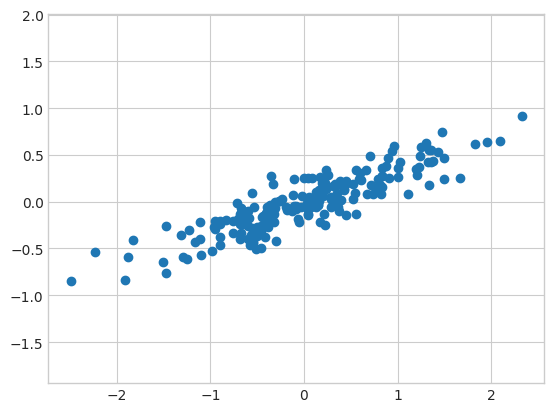

In [ ]:
# Configura el generador de números aleatorios
rng = np.random.RandomState(1)

# Genera los datos X
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T

# Utiliza el estilo deseado de seaborn directamente
sns.set_style('whitegrid')

# Realiza la gráfica de dispersión
plt.scatter(X[:, 0], X[:, 1])

# Ajusta el aspecto de los ejes
plt.axis('equal')

# Muestra la gráfica
plt.show()


A simple vista, es evidente que hay una relación casi lineal entre las variables. El escenario del problema aquí es ligeramente diferente: en lugar de intentar predecir los valores de *y* a partir de los valores de *x*, el problema de aprendizaje no supervisado intenta aprender sobre la relación entre los valores de *x* e *y*.

En el análisis de componentes principales, esta relación se cuantifica encontrando una lista de los ejes principales en los datos y usando esos ejes para describir el conjunto de datos.

Utilizando el estimador PCA de Scikit-Learn, podemos calcular esto de la siguiente manera:

In [ ]:
from sklearn.decomposition import PCA


pca = PCA(n_components=2)
pca.fit(X)

PCA(n_components=2)

El ajuste aprende algunas cantidades de los datos, especialmente los componentes y la varianza explicada:

In [ ]:
print(pca.components_)

[[-0.94446029 -0.32862557]
 [-0.32862557  0.94446029]]


In [ ]:
print(pca.explained_variance_)

[0.7625315 0.0184779]


Para entender qué significan estos números, visualicémoslos como vectores sobre los datos de entrada, utilizando los componentes para definir la dirección del vector y la varianza explicada para definir la longitud al cuadrado del vector:

(-2.7292712056271964,
 2.5702744393352615,
 -0.9326181575178751,
 1.004413830229183)

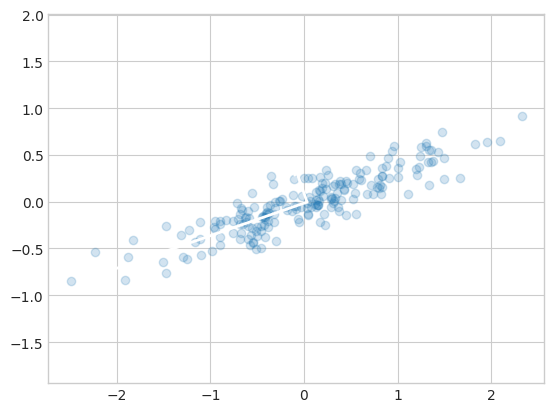

In [ ]:
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->', linewidth=2,
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)

# Graficar los datos
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)

# Iterar sobre las longitudes y vectores de los componentes principales
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * 3 * np.sqrt(length)
    draw_vector(pca.mean_, pca.mean_ + v)

plt.axis('equal')


Estos vectores representan los ejes principales de los datos, y la longitud de cada vector es una indicación de cuán "importante" es ese eje para describir la distribución de los datos; más precisamente, es una medida de la varianza de los datos cuando se proyectan sobre ese eje. La proyección de cada punto de datos sobre los ejes principales son los componentes principales de los datos.

# PCA como Reducción de Dimensionalidad
Utilizar PCA para la reducción de dimensionalidad implica anular uno o más de los componentes principales más pequeños, lo que resulta en una proyección de menor dimensionalidad de los datos que preserva la máxima varianza de los datos.

In [ ]:
# Importar la clase PCA de scikit-learn
from sklearn.decomposition import PCA

# Crear una instancia de PCA con 1 componente principal
pca = PCA(n_components=1)

# Ajustar el modelo PCA a los datos X
pca.fit(X)

# Transformar los datos X al nuevo espacio de menor dimensión
X_pca = pca.transform(X)

# Imprimir la forma (dimensiones) de los datos originales y transformados
print("original shape:   ", X.shape)
print("transformed shape:", X_pca.shape)


original shape:    (200, 2)
transformed shape: (200, 1)


Los datos transformados se han reducido a una sola dimensión. Para comprender el efecto de esta reducción de dimensionalidad, podemos realizar la transformación inversa de estos datos reducidos y graficarlos junto con los datos originales.

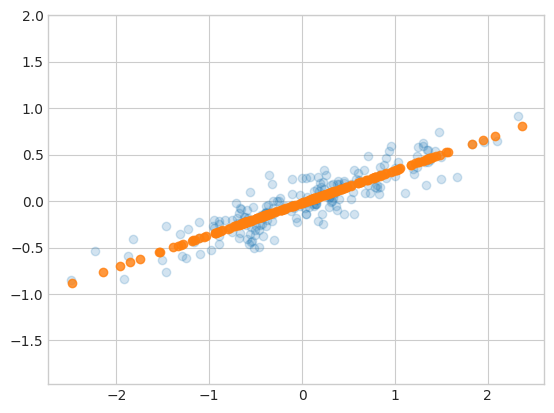

In [ ]:
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.8)
plt.axis('equal');

Los puntos claros son los datos originales, mientras que los puntos oscuros son la versión proyectada. Esto aclara lo que significa una reducción de dimensionalidad mediante PCA: se elimina la información a lo largo del eje o ejes principales menos importantes, dejando solo el componente o componentes de los datos con la mayor varianza. La fracción de varianza que se elimina (proporcional a la dispersión de los puntos alrededor de la línea formada en la figura anterior) es aproximadamente una medida de cuánta "información" se descarta en esta reducción de dimensionalidad.

Este conjunto de datos de dimensiones reducidas es, en cierto sentido, "suficientemente bueno" para codificar las relaciones más importantes entre los puntos: a pesar de reducir el número de características de datos en un 50%, las relaciones generales entre los puntos de datos se conservan en su mayoría.

#Ejemplo

In [ ]:
from numpy import array, dot, cos, sin, radians, zeros, identity, ones,sqrt, cov, argsort
from numpy.linalg import eigh, svd
from matplotlib import pyplot as plt
from sklearn.datasets import load_iris, load_breast_cancer, load_digits
from sklearn.decomposition import PCA
import seaborn as sns
import pandas as pd
%matplotlib inline

In [ ]:
def pca(datos, dimens=2):
    m, n = datos.shape  # Obtener las dimensiones de los datos
    D = datos[:]  # Realizar una copia superficial de los datos
    D -= datos.mean(axis=0)  # Centrar los datos restando la media de cada columna
    S = cov(D, rowvar=False)  # Calcular la matriz de covarianza
    evals, evecs = eigh(S)  # Calcular los valores y vectores propios de la matriz de covarianza
    idx = argsort(evals)[::-1]  # Ordenar los valores propios en orden descendente
    evecs = evecs[:,idx]  # Ordenar los vectores propios de acuerdo a los valores propios ordenados
    evals = evals[idx]  # Ordenar los valores propios
    evecs = evecs[:, :dimens]  # Seleccionar solo los primeros 'dimens' vectores propios
    # Calcular la proyección de los datos centrados en el nuevo espacio y devolverla junto con los valores y vectores propios seleccionados
    return dot(evecs.T, D.T).T, evals, evecs


In [ ]:
# conjunto de datos de sklearn - breast cancer
boston = load_breast_cancer()
print(boston['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [ ]:
datos = boston['data']
target = boston['target']
columnas = boston['feature_names']
df = pd.DataFrame(datos, columns=columnas)

In [ ]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [ ]:
sns.pairplot(df)

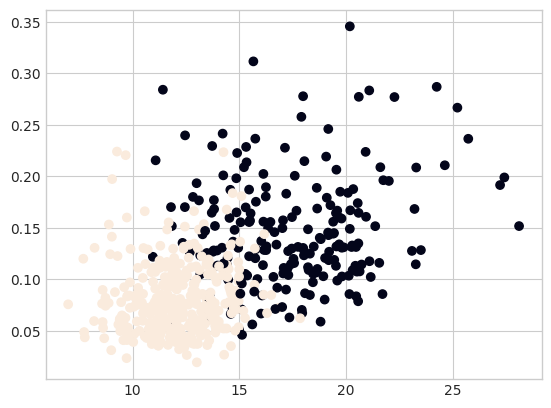

In [ ]:
plt.scatter(datos[:,0], datos[:,5], c=target)

In [ ]:
Xpca, l, v = pca(datos, 2)

v.shape

(30, 2)

In [ ]:
normalizados = array([i/sum(l) for i in l])


In [ ]:
normalizados.cumsum()


array([0.98204467, 0.99822116, 0.99977867, 0.9998996 , 0.99998788,
       0.99999453, 0.99999854, 0.99999936, 0.99999971, 0.99999989,
       0.99999996, 0.99999998, 0.99999999, 0.99999999, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ])

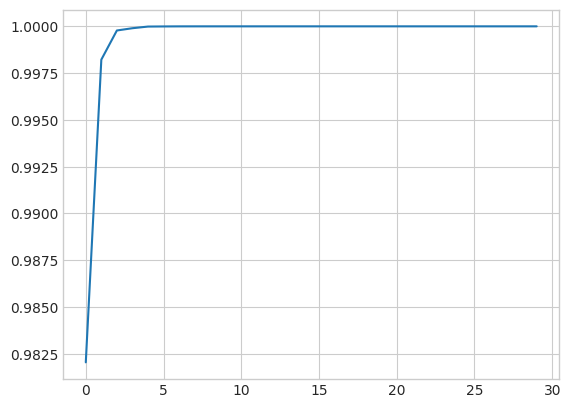

In [ ]:
plt.plot(normalizados.cumsum())


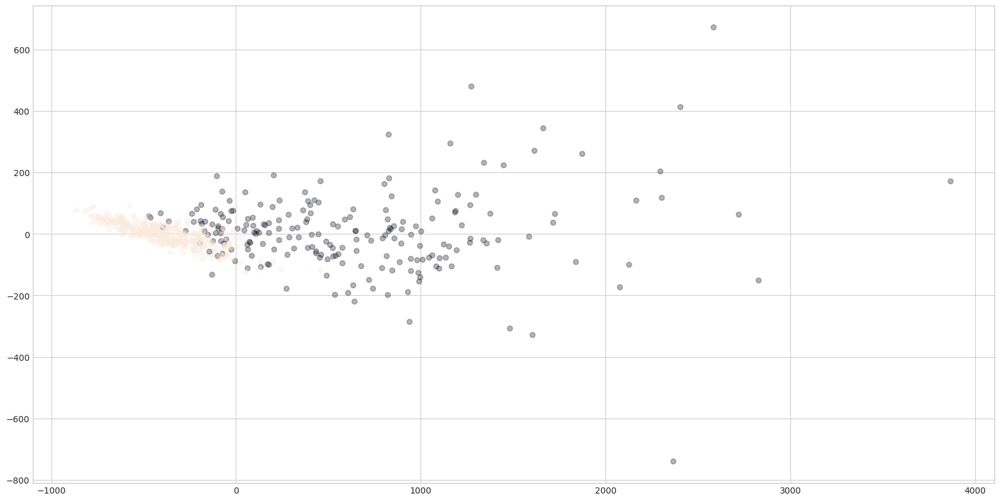

In [ ]:
fig = plt.figure(figsize=(20,10))
plt.scatter(Xpca[:,0], Xpca[:,1], c=target, alpha=0.3)